# A Single-Cell and Spatial Map of the Colorectal Epithelium in Health and Gastrointestinal Disorders
This notebook contains preprocessing steps and figure generation code associated with the analyses presented in the paper. The goal is to ensure transparency and reproducibility by documenting key data handling, integration, and visualization steps for the spatial transcriptomics data.

In [15]:
import scanpy as sc
import anndata as ad
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import sklearn
import scipy
import matplotlib_scalebar
import popv
import os

print("scanpy: Version ", sc.__version__)
print("anndata: Version ", ad.__version__)
print("pandas: Version ", pd.__version__)
print("numpy: Version ", np.__version__)
print("scikit-learn: Version ", sklearn.__version__)
print("scipy: Version ", scipy.__version__)
print("matplotlib: Version ", matplotlib.__version__)
print("matplotlib-scalebar: Version ", matplotlib_scalebar.__version__)
print("popv: Version ", popv.__version__)

scanpy: Version  1.11.0
anndata: Version  0.11.3
pandas: Version  2.2.2
numpy: Version  2.1.3
scikit-learn: Version  1.5.2
scipy: Version  1.15.2
matplotlib: Version  3.10.1
matplotlib-scalebar: Version  0.9.0
popv: Version  0.5.2.post1


In [9]:
import pandas as pd
def add_matching_obs(spatial_adata, processed_adata):
    """
    Adds matching observations from processed AnnData to spatial AnnData using pd.concat.
    Parameters
    ----------
    spatial_adata : anndata.AnnData
        The original spatial AnnData object.
    processed_adata : anndata.AnnData
        The processed AnnData object containing updated obs to be added.
    Returns
    -------
    spatial_adata : anndata.AnnData
        The updated spatial AnnData with added obs fields.
    """
    # Select new columns from processed AnnData that are not in spatial AnnData, and only the matching indices
    new_columns = processed_adata.obs.loc[
        processed_adata.obs.index.intersection(spatial_adata.obs.index),
        processed_adata.obs.columns.difference(spatial_adata.obs.columns)
    ]
    # Concatenate the new columns to the spatial obs DataFrame
    spatial_adata.obs = pd.concat([spatial_adata.obs, new_columns], axis=1)

    return spatial_adata

In [3]:
sc_colon = sc.read_h5ad('/user/leuven/337/vsc33740/stg_00077/projects/merscope_helmsley/CD_and_HV_Colon_only.h5ad')
sc_rectum = sc.read_h5ad('/user/leuven/337/vsc33740/stg_00077/projects/merscope_helmsley/IBS_and_HV_rectum_only.h5ad')
sc_healthy = sc.read_h5ad('/user/leuven/337/vsc33740/stg_00077/projects/merscope_helmsley/HV_only_Colon_and_rectum.h5ad')

In [4]:
merged_spatial_colon  = sc.read_h5ad('/user/leuven/337/vsc33740/VSC_DATA/merged_spatial_colon.h5ad')
merged_spatial_rectum  = sc.read_h5ad('/user/leuven/337/vsc33740/VSC_DATA/merged_spatial_rectum.h5ad')

In [5]:
sc_colon.obs_names_make_unique()
sc_rectum.obs_names_make_unique()
sc_healthy.obs_names_make_unique()
merged_spatial_colon.obs_names_make_unique()
merged_spatial_rectum.obs_names_make_unique()

In [6]:
sc_colon_healthy = sc_colon[sc_colon.obs['Subtype']=='HV']
sc_colon_CD_IBS = sc_colon[sc_colon.obs['Subtype']=='CD+IBS']
sc_colon_CD_NO_IBS = sc_colon[sc_colon.obs['Subtype']=='CD-IBS']

sc_rectum_healthy = sc_rectum[sc_rectum.obs['Subtype']=='HV']
sc_rectum_IBS_C = sc_rectum[sc_rectum.obs['Subtype']=='IBS-C']
sc_rectum_IBS_D = sc_rectum[sc_rectum.obs['Subtype']=='IBS-D']

sc_healthy_colon = sc_healthy[sc_healthy.obs['Tissue']=='Colon']
sc_healthy_rectum = sc_healthy[sc_healthy.obs['Tissue']=='Rectum']
sc_healthy_colon = sc_healthy_colon[~sc_healthy_colon.obs['Cluster'].isin(['AbC-immature(R)', 'AbC-progenitor(R)'])].copy()
sc_healthy_rectum = sc_healthy_rectum[~sc_healthy_rectum.obs['Cluster'].isin(['AbC-progenitor(C)'])].copy()

In [8]:
spatial_colon_healthy = merged_spatial_colon[merged_spatial_colon.obs['condition']=='Healthy-Colon']
spatial_colon_CD_IBS = merged_spatial_colon[merged_spatial_colon.obs['condition']=='CD+IBS-Colon']
spatial_colon_CD_NO_IBS = merged_spatial_colon[merged_spatial_colon.obs['condition']=='CD-IBS-Colon']

spatial_rectum_healthy = merged_spatial_rectum[merged_spatial_rectum.obs['condition']=='Healthy-Rectum']
spatial_rectum_IBS_C = merged_spatial_rectum[merged_spatial_rectum.obs['condition']=='IBS-C-Rectum']
spatial_rectum_IBS_D = merged_spatial_rectum[merged_spatial_rectum.obs['condition']=='IBS-D-Rectum']

slide_pin_table_rectum = merged_spatial_rectum.obs[["Slide", "correctPIN"]].drop_duplicates().set_index("Slide")
slide_pin_table_colon = merged_spatial_colon.obs[["Slide", "correctPIN"]].drop_duplicates().set_index("Slide")


        correctPIN
Slide             
slide0   PIN1337_1
slide1   PIN1337_2
slide2   PIN1274_1
slide3   PIN1274_2
slide4   PIN1489_1
slide5   PIN1489_2
slide6   PIN1456_1
slide7   PIN1456_2
slide16    PIN1340
slide17    PIN1067
slide18    PIN1540
slide19    PIN1479
slide20    PIN1491
slide21    PIN1487
slide22    PIN1458
        correctPIN
Slide             
slide8     PIN1363
slide9     PIN1358
slide10  PIN1457_1
slide11  PIN1457_2
slide12    PIN1440
slide13    PIN1733
slide14    PIN1328
slide15    PIN1385
slide24    PIN1588
slide25    PIN1595
slide26    PIN1812
slide27    PIN1855
slide28    PIN1526
slide29    PIN1565
slide30    PIN1591
slide31    PIN1639


In [ ]:
from popv.preprocessing import Process_Query
from popv.annotation import annotate_data

In [ ]:
# Base output directory
base_output_dir = "../../popv_output/Xenium_Alexandre/"
# Corrected mapping dictionary with string keys
# Explicit mapping of spatial data to scRNA data -> Disease with Disease and Healthy with Healthy
sc_spatial_mapping = {
    "spatial_colon_healthy_only" : sc_healthy_colon
    "spatial_colon_healthy_disease": sc_colon_healthy,
    "spatial_colon_CD_IBS": sc_colon_CD_IBS,
    "spatial_colon_CD_NO_IBS": sc_colon_CD_NO_IBS,
    "spatial_rectum_healthy_only":sc_healthy_rectum
    "spatial_rectum_healthy_disease": sc_rectum_healthy,
    "spatial_rectum_IBS_C": sc_rectum_IBS_C,
    "spatial_rectum_IBS_D": sc_rectum_IBS_D,
}

# Store all spatial AnnData objects explicitly in a dictionary
spatial_data_dict = {
    "spatial_colon_healthy_only":spatial_colon_healthy_only
    "spatial_colon_healthy_disease": spatial_colon_healthy_disease,
    "spatial_colon_CD_IBS": spatial_colon_CD_IBS,
    "spatial_colon_CD_NO_IBS": spatial_colon_CD_NO_IBS,
    "spatial_rectum_healthy_only":spatial_rectum_healthy_only
    "spatial_rectum_healthy_disease": spatial_rectum_healthy_disease,
    "spatial_rectum_IBS_C": spatial_rectum_IBS_C,
    "spatial_rectum_IBS_D": spatial_rectum_IBS_D,
}

# Loop through the mapping to process spatial and scRNA data
for spatial_key, scrna_data in sc_spatial_mapping.items():
    print(f"Processing: scRNA data {scrna_data} with spatial data {spatial_key}")
    # Load spatial data from the dictionary
    spatial_data = spatial_data_dict[spatial_key]
    spatial_data.obs_names_make_unique()
    scrna_data.X = scrna_data.layers["rawcounts"]
    spatial_data.X = spatial_data.layers["rawcounts"]
    
    # Process the query data (spatial data) using Process_Query
    processed_adata = Process_Query(
        query_adata=spatial_data,         # Query data (spatial dataset)
        ref_adata=scrna_data,             # Reference data (scRNA-seq)
        query_batch_key='Slide',         # Batch key in query data
        ref_labels_key='Cluster',        # Use 'Cluster' as labels in scRNA data
        ref_batch_key='orig.ident',      # Batch key in scRNA data
        unknown_celltype_label='unknown',     # Label for unknown cell types
        save_path_trained_models="trained_models_path",  # Path to save trained models (optional)
        cl_obo_folder=False,             # No ontology folder required
        prediction_mode="retrain",       # Use 'retrain' or 'inference' mode
        hvg=None,                        # Use all genes
        n_samples_per_label=1000        # Number of samples per label
    ).adata
    
    print(f"Finished processing spatial data: {spatial_key}")
    print(processed_adata)
    # Annotate the processed data
    annotate_data(processed_adata, save_path=base_output_dir,methods=['SCANVI_POPV'])
    
    # Add matching observations between spatial and processed data
    spatial_data_annotated = add_matching_obs(spatial_data, processed_adata)
    print(spatial_data_annotated)
    # Save the spatial data with its corresponding name
    output_file = f"{base_output_dir}{spatial_key}{'_disease' if 'disease' in spatial_key else ''}_annotated_umap.h5ad"
    spatial_data_annotated.obs['_ref_subsample']=spatial_data_annotated.obs['_ref_subsample'].astype(bool)
    print(output_file)
    processed_adata.write_h5ad(output_file)
    print(f"Finished processing and saved: {spatial_key} -> {output_file}")

In [ ]:
# spatial_colon_healthy_only.write_h5ad('../../popv_output/Xenium_Alexandre/spatial_colon_healthy_ONLY_HEALTHY_annotated_umap.h5ad')
# spatial_colon_healthy_disease.write_h5ad('../../popv_output/Xenium_Alexandre/spatial_colon_healthy_disease_annotated_umap.h5ad')
# spatial_colon_CD_IBS.write_h5ad('../../popv_output/Xenium_Alexandre/spatial_colon_CD_IBS_annotated_umap.h5ad')
# spatial_colon_CD_NO_IBS.write_h5ad('../../popv_output/Xenium_Alexandre/spatial_colon_CD_NO_IBS_annotated_umap.h5ad')
# spatial_rectum_healthy_only.write_h5ad('../../popv_output/Xenium_Alexandre/spatial_rectum_healthy_ONLY_HEALTHY_annotated_umap.h5ad')
# spatial_rectum_healthy_disease.write_h5ad('../../popv_output/Xenium_Alexandre/spatial_rectum_healthy_disease_annotated_umap.h5ad')
# spatial_rectum_IBS_C.write_h5ad('../../popv_output/Xenium_Alexandre/spatial_rectum_IBS_C_annotated_umap.h5ad')
# spatial_rectum_IBS_D.write_h5ad('../../popv_output/Xenium_Alexandre/spatial_rectum_IBS_D_annotated_umap.h5ad')

In [10]:
spatial_colon_healthy_only = sc.read_h5ad('../../popv_output/Xenium_Alexandre/spatial_colon_healthy_ONLY_HEALTHY_annotated_umap.h5ad')
spatial_colon_healthy_disease= sc.read_h5ad('../../popv_output/Xenium_Alexandre/spatial_colon_healthy_disease_annotated_umap.h5ad')
spatial_colon_CD_IBS = sc.read_h5ad('../../popv_output/Xenium_Alexandre/spatial_colon_CD_IBS_annotated_umap.h5ad')
spatial_colon_CD_NO_IBS = sc.read_h5ad('../../popv_output/Xenium_Alexandre/spatial_colon_CD_NO_IBS_annotated_umap.h5ad')
spatial_rectum_healthy_only = sc.read_h5ad('../../popv_output/Xenium_Alexandre/spatial_rectum_healthy_ONLY_HEALTHY_annotated_umap.h5ad')
spatial_rectum_healthy_disease= sc.read_h5ad('../../popv_output/Xenium_Alexandre/spatial_rectum_healthy_disease_annotated_umap.h5ad')
spatial_rectum_IBS_C = sc.read_h5ad('../../popv_output/Xenium_Alexandre/spatial_rectum_IBS_C_annotated_umap.h5ad')
spatial_rectum_IBS_D = sc.read_h5ad('../../popv_output/Xenium_Alexandre/spatial_rectum_IBS_D_annotated_umap.h5ad')

In [ ]:
# Function to filter and remove cells with different probability thresholds
def filter_and_remove(adata, dataset_name):
    """
    Applies different probability thresholds for specific cell types.
    Removes cells based on `popv_scanvi_prediction_probabilities` and assigns annotations.

    Parameters:
    - adata: AnnData object
    - dataset_name: Name of the dataset (for logging)
    
    Returns:
    - Filtered AnnData object
    """
    # Define cell types that get a more relaxed threshold
    relaxed_celltypes = {"GC-intermediate", "SC", "TA", "TF"}

    # Create a mask: Cells in `relaxed_celltypes` get 0.99, all others get 0.95
    mask = (
        (adata.obs['popv_scanvi_prediction_probabilities'] > 0) &
        (
            (adata.obs['popv_scanvi_prediction'].isin(relaxed_celltypes) & 
             (adata.obs['popv_scanvi_prediction_probabilities'] < 0.95)) |  
            (~adata.obs['popv_scanvi_prediction'].isin(relaxed_celltypes) & 
             (adata.obs['popv_scanvi_prediction_probabilities'] < 1))
        )
    )

    # Count removed cells
    num_removed = adata.shape[0] - mask.sum()
    
    # Apply filtering (keep only valid cells)
    filtered_adata = adata[mask].copy()
    filtered_adata.obs['annotation'] = filtered_adata.obs['popv_scanvi_prediction']

    # Print filtering statistics
    print(f"{dataset_name}: Removed {num_removed} cells (Remaining: {filtered_adata.shape[0]})")
    return filtered_adata

# Apply the function to all datasets
spatial_colon_healthy_only = filter_and_remove(spatial_colon_healthy_only, "spatial_colon_healthy_only")
spatial_colon_healthy_disease = filter_and_remove(spatial_colon_healthy_disease, "spatial_colon_healthy_disease")
spatial_colon_CD_IBS = filter_and_remove(spatial_colon_CD_IBS, "spatial_colon_CD_IBS")
spatial_colon_CD_NO_IBS = filter_and_remove(spatial_colon_CD_NO_IBS, "spatial_colon_CD_NO_IBS")
spatial_rectum_healthy_only = filter_and_remove(spatial_rectum_healthy_only, "spatial_rectum_healthy_only")
spatial_rectum_healthy_disease = filter_and_remove(spatial_rectum_healthy_disease, "spatial_rectum_healthy_disease")
spatial_rectum_IBS_C = filter_and_remove(spatial_rectum_IBS_C, "spatial_rectum_IBS_C")
spatial_rectum_IBS_D = filter_and_remove(spatial_rectum_IBS_D, "spatial_rectum_IBS_D")


In [12]:
# Concatenate all spatial colon datasets
spatial_colon_combined = sc.concat(
    [spatial_colon_healthy_only,spatial_colon_healthy_disease, spatial_colon_CD_IBS, spatial_colon_CD_NO_IBS],
    label="batch",
    keys=["healthy","healthy-CD", "CD_IBS", "CD_NO_IBS"])

# Concatenate all spatial rectum datasets
spatial_rectum_combined = sc.concat(
    [spatial_rectum_healthy_only,spatial_rectum_healthy_disease, spatial_rectum_IBS_C, spatial_rectum_IBS_D],
    label="batch",
    keys=["healthy","healthy-IBS", "IBS_C", "IBS_D"])
print(spatial_colon_combined)
# spatial_colon_combined = spatial_colon_combined[~spatial_colon_combined.obs["Cluster"].isna()]
print(spatial_rectum_combined)
# spatial_rectum_combined = spatial_rectum_combined[~spatial_rectum_combined.obs["Cluster"].isna()]

AnnData object with n_obs × n_vars = 253778 × 113
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'S.Score', 'G2M.Score', 'Phase', 'old.ident', 'RNA_snn_res.0.4', 'RNA_snn_res.0.5', 'RNA_snn_res.0.6', 'RNA_snn_res.0.7', 'RNA_snn_res.0.8', 'RNA_snn_res.0.9', 'RNA_snn_res.1', 'RNA_snn_res.1.1', 'RNA_snn_res.1.2', 'RNA_snn_res.1.3', 'RNA_snn_res.1.4', 'seurat_clusters', 'PIN', 'Status', 'Subtype', 'RNA_snn_res.1.5', 'RNA_snn_res.1.6', 'RNA_snn_res.3', 'Tissue', 'Cluster', '_batch_annotation', 'n_counts', '_dataset', '_reference_labels_annotation', '_labels_annotation', '_ref_subsample', 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'wrongPIN', 'correctPIN', 'tissue', 'condition', 'runnumber', 'Slide', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', '_l

In [13]:
import matplotlib.colors as mcolors
import colorsys
import numpy as np
import glasbey

def lighten_color(color, amount=0.5):
    """
    Lightens a given color by blending it with white.
    
    Parameters:
    - color: Color in hex or RGB format
    - amount: How much to lighten (0 = original, 1 = white)
    
    Returns:
    - Pastel-like color in hex format
    """
    try:
        c = np.array(mcolors.to_rgb(color))  # Convert to RGB array
        white = np.array([1, 1, 1])  # White color
        new_color = (1 - amount) * c + amount * white  # Blend with white
        return mcolors.to_hex(new_color)  # Convert back to hex
    except ValueError:
        return color  # Fallback to original if conversion fails

# Extract unique cell types
colon_celltypes = set(spatial_colon_combined.obs["annotation"].unique())
rectum_celltypes = set(spatial_rectum_combined.obs["annotation"].unique())

# Find overlapping cell types
overlapping_celltypes = colon_celltypes.intersection(rectum_celltypes)

# Find unique cell types
unique_colon_celltypes = colon_celltypes - overlapping_celltypes
unique_rectum_celltypes = rectum_celltypes - overlapping_celltypes

# Define total number of cell types
total_celltypes = len(overlapping_celltypes) + len(unique_colon_celltypes) + len(unique_rectum_celltypes)

# Generate a distinct Glasbey color palette
glasbey_palette = glasbey.create_palette(palette_size=total_celltypes)

# Convert Glasbey colors to pastel
glasbey_colors = [lighten_color(mcolors.to_hex(color), amount=0.4) for color in glasbey_palette]

# Create a dictionary to store pastel colors
celltype_colormap = {}

# Assign colors to overlapping cell types (same color for both)
for i, celltype in enumerate(sorted(overlapping_celltypes)):
    celltype_colormap[celltype] = glasbey_colors[i]

# Assign colors to unique colon cell types
for i, celltype in enumerate(sorted(unique_colon_celltypes)):
    celltype_colormap[celltype] = glasbey_colors[len(overlapping_celltypes) + i]

# Assign colors to unique rectum cell types
for i, celltype in enumerate(sorted(unique_rectum_celltypes)):
    celltype_colormap[celltype] = glasbey_colors[len(overlapping_celltypes) + len(unique_colon_celltypes) + i]

# Print the pastel color mapping
for celltype, color in celltype_colormap.items():
    print(f"Cell Type: {celltype}, Color: {color}")

Cell Type: AQP8+ CEACAM7+ AbC, Color: #e47479
Cell Type: AbC-progenitor, Color: #74a5ff
Cell Type: BEST4+ AbC, Color: #66b966
Cell Type: CA1+ AbC, Color: #f8a7ff
Cell Type: CA1+ AbC-immature, Color: #aa66af
Cell Type: CA1+ CEACAM7+ AbC-early, Color: #ccfd66
Cell Type: CA1+ CEACAM7+ AbC-late, Color: #66d8da
Cell Type: D-EEC, Color: #ffc786
Cell Type: ECC, Color: #9e8b68
Cell Type: EEC-progenitor, Color: #6b66b9
Cell Type: GC-immature, Color: #669e9e
Cell Type: GC-intermediate, Color: #c2b1b4
Cell Type: GC-mature, Color: #c7ceff
Cell Type: L-EEC, Color: #c0d3ac
Cell Type: SC, Color: #c57eff
Cell Type: TA, Color: #946672
Cell Type: TF, Color: #ffced8
Cell Type: AQP8+ CEACAM7+ CA1+ AbC, Color: #e266be
Cell Type: AbC-immature(C), Color: #66ffd3
Cell Type: AbC-progenitor(C), Color: #668166
Cell Type: EEC, Color: #c5ac66
Cell Type: PC, Color: #8b868d
Cell Type: SymAC-1, Color: #f8f3be
Cell Type: SymAC-2, Color: #a3a0b9
Cell Type: AbC-immature, Color: #b98b94
Cell Type: AbC-immature(R), Color:

... storing 'RNA_snn_res.0.4' as categorical
... storing 'RNA_snn_res.0.5' as categorical
... storing 'RNA_snn_res.0.6' as categorical
... storing 'RNA_snn_res.0.7' as categorical
... storing 'RNA_snn_res.0.8' as categorical
... storing 'RNA_snn_res.0.9' as categorical
... storing 'RNA_snn_res.1' as categorical
... storing 'RNA_snn_res.1.1' as categorical
... storing 'RNA_snn_res.1.2' as categorical
... storing 'RNA_snn_res.1.3' as categorical
... storing 'RNA_snn_res.1.4' as categorical
... storing 'seurat_clusters' as categorical
... storing 'RNA_snn_res.1.5' as categorical
... storing 'RNA_snn_res.1.6' as categorical
... storing 'RNA_snn_res.3' as categorical


Processing batch: healthy
Saved: ../Figures_Alexandre/Colon_healthy_SCANVI_UMAP_annotation_singlecell_spatial_combined.svg


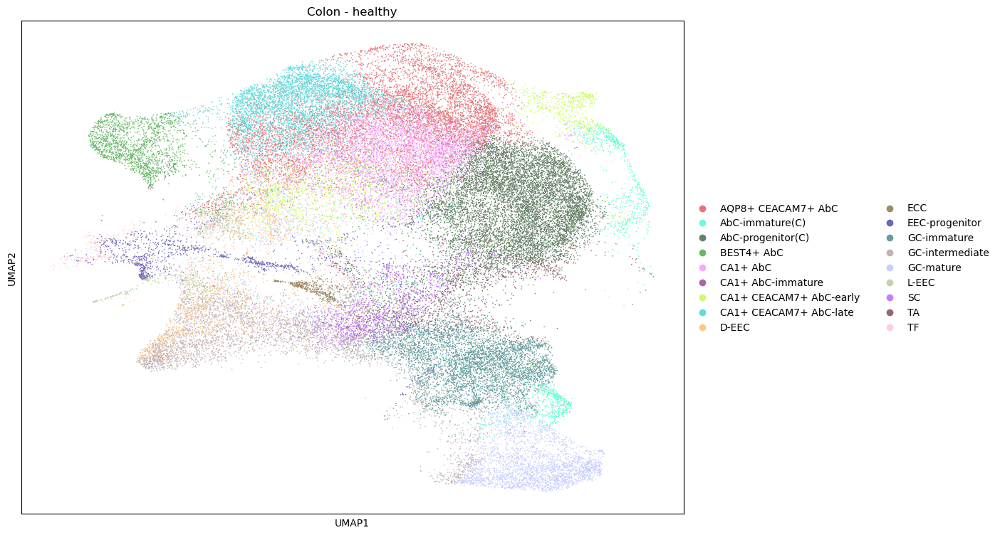

Processing batch: healthy-CD
Saved: ../Figures_Alexandre/Colon_healthy-CD_SCANVI_UMAP_annotation_singlecell_spatial_combined.svg


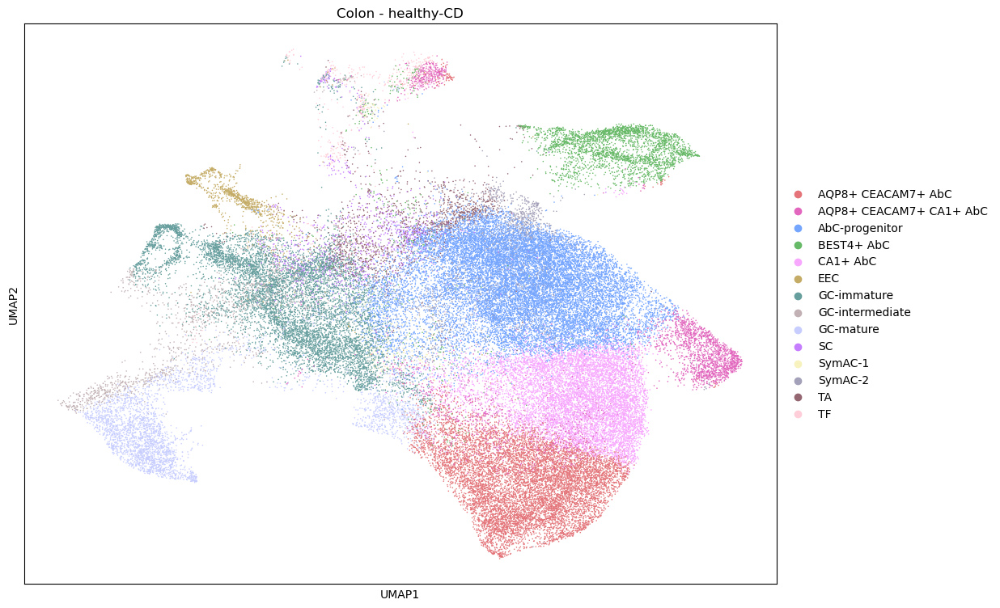

Processing batch: CD_IBS
Saved: ../Figures_Alexandre/Colon_CD_IBS_SCANVI_UMAP_annotation_singlecell_spatial_combined.svg


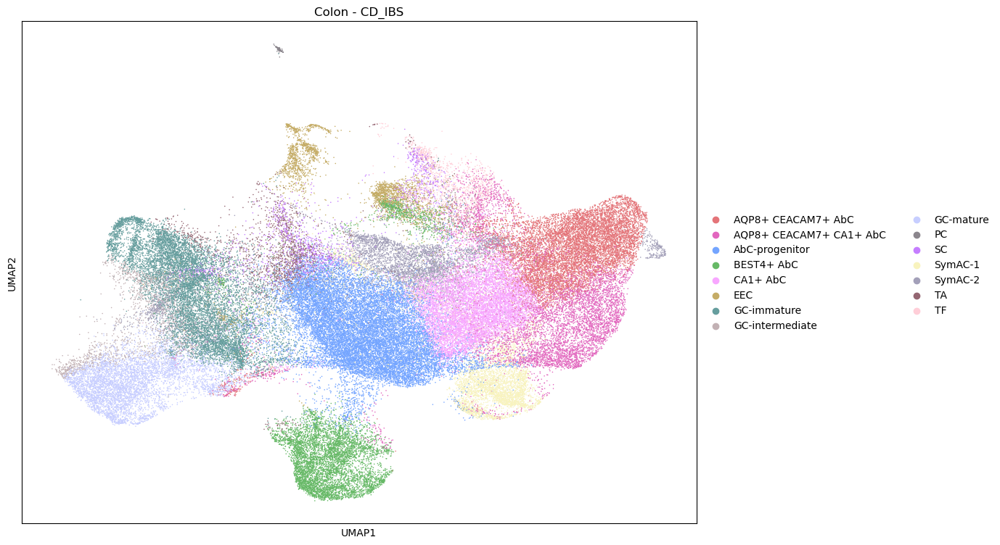

Processing batch: CD_NO_IBS
Saved: ../Figures_Alexandre/Colon_CD_NO_IBS_SCANVI_UMAP_annotation_singlecell_spatial_combined.svg


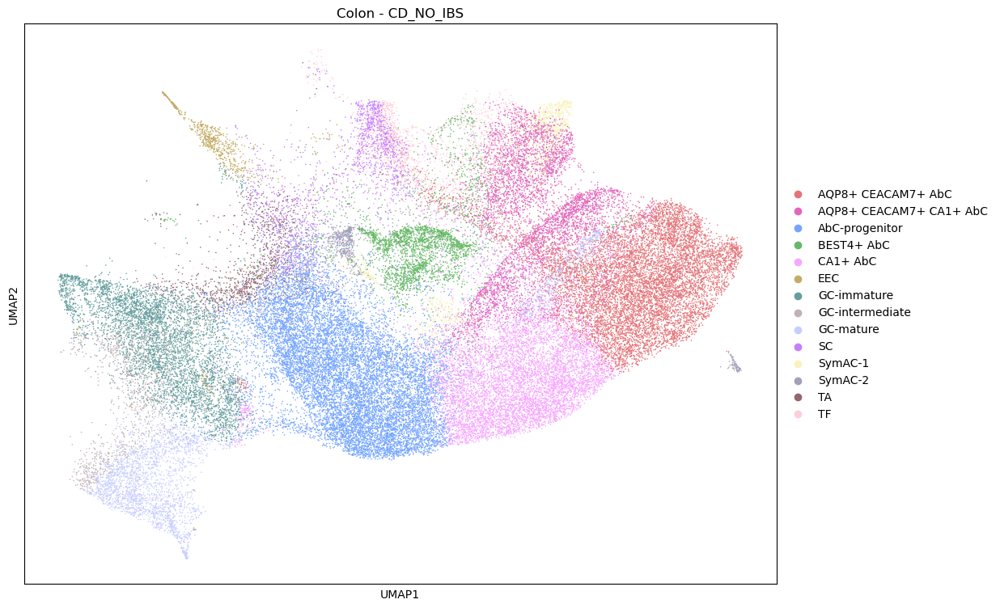

Processing batch: healthy
Saved: ../Figures_Alexandre/Rectum_healthy_SCANVI_UMAP_annotation_singlecell_spatial_combined.svg


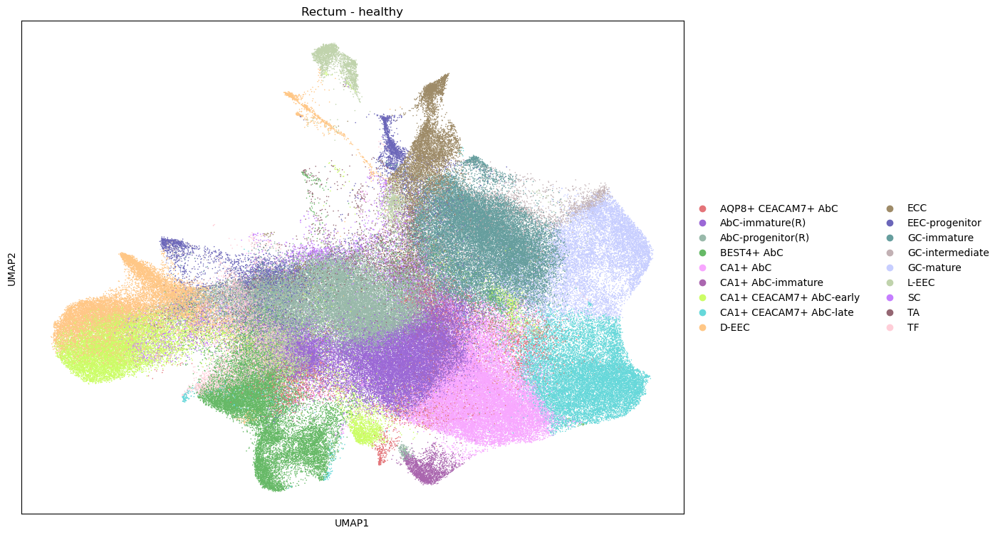

Processing batch: healthy-IBS
Saved: ../Figures_Alexandre/Rectum_healthy-IBS_SCANVI_UMAP_annotation_singlecell_spatial_combined.svg


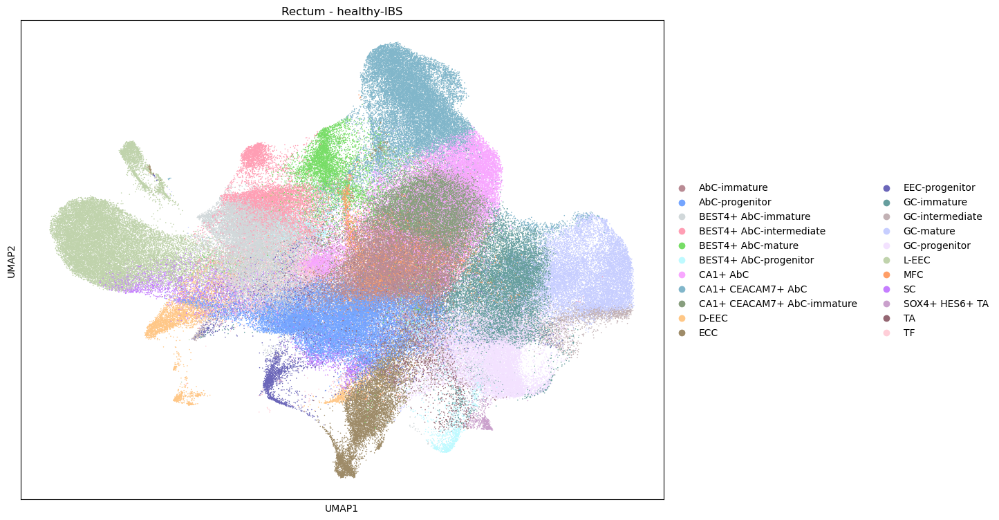

Processing batch: IBS_C
Saved: ../Figures_Alexandre/Rectum_IBS_C_SCANVI_UMAP_annotation_singlecell_spatial_combined.svg


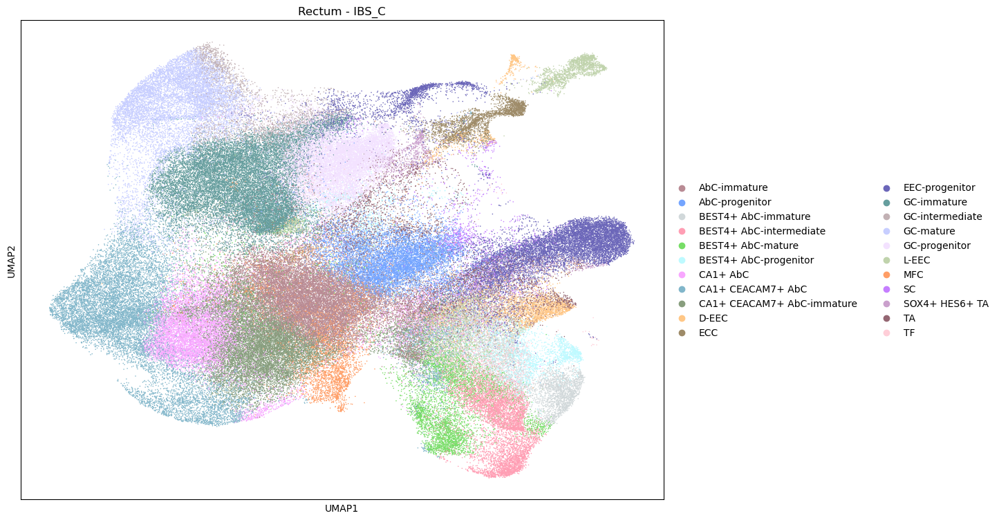

Processing batch: IBS_D
Saved: ../Figures_Alexandre/Rectum_IBS_D_SCANVI_UMAP_annotation_singlecell_spatial_combined.svg


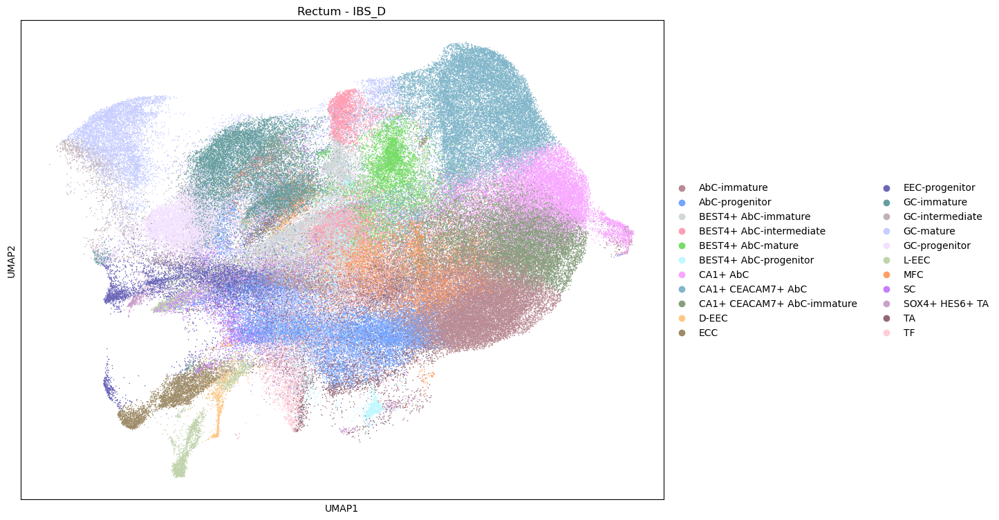

In [16]:
# Ensure output directory exists
output_dir = "../Figures_Alexandre/"
os.makedirs(output_dir, exist_ok=True)

# Function to generate UMAP plots per batch
def plot_umap_per_batch(adata, dataset_name, umap_key="X_umap_scanvi_popv"):
    """
    Generates and saves UMAP plots for each batch in a spatial dataset.

    Parameters:
    - adata: AnnData object
    - dataset_name: Name of the dataset (e.g., "Colon_Healthy")
    - umap_key: Key for the UMAP embedding in obsm (default: "X_scanvi_umap_popv")
    """
    # Assign the UMAP embedding
    adata.obsm["X_umap"] = adata.obsm[umap_key]

    # Iterate over unique batches
    for batch in adata.obs["batch"].unique():
        print(f"Processing batch: {batch}")
        fig, ax = plt.subplots(figsize=(12, 9))

        # Subset the dataset by batch
        batch_adata = adata[adata.obs["batch"] == batch].copy()

        # Generate UMAP plot
        sc.pl.umap(
            batch_adata,
            color=["annotation"],
            palette=celltype_colormap,
            ncols=1,
            size=5,
            title=f"{dataset_name} - {batch}",ax=ax,
            show=False
        )
        for ax in fig.axes:
            for artist in ax.collections:
                artist.set_rasterized(True)
        # Save the plot
        output_file = os.path.join(output_dir, f"{dataset_name}_{batch}_SCANVI_UMAP_annotation_singlecell_spatial_combined.svg")
        # plt.savefig(output_file, format="svg", bbox_inches="tight",dpi=400)
        print(f"Saved: {output_file}")
        plt.show()
        # Close the plot to free memory
        plt.close()

# # Generate UMAP plots for all batches in each dataset
plot_umap_per_batch(spatial_colon_combined, "Colon")
plot_umap_per_batch(spatial_rectum_combined, "Rectum")

In [28]:
# import os
# import numpy as np
# import matplotlib.pyplot as plt
# import scanpy as sc


def rotate_coords(x, y, angle_deg):
    """Rotate x,y coordinates by a given angle (in degrees)."""
    theta = np.deg2rad(angle_deg)
    cos_theta, sin_theta = np.cos(theta), np.sin(theta)
    x_new = cos_theta * x - sin_theta * y
    y_new = sin_theta * x + cos_theta * y
    return x_new, y_new


def plot_and_save_rotated_spatial(
    adata, dataset_name, rotation_dict, output_dir,
    spot_size=15, target_pins=None, crop_regions=None,pixel_size=1.0
):
    """
    Rotates spatial coordinates per slide, plots spatial data with optional cropping and coordinate grid,
    and saves the figures.
    """
    unique_slides = adata.obs["Slide"].dropna().unique()

    for slide in unique_slides:
        if slide not in rotation_dict:
            print(f"Skipping {slide} (no rotation angle provided).")
            continue

        temp_sample = adata[adata.obs["Slide"] == slide].copy()
        pin = temp_sample.obs['correctPIN'].unique()[0]
        if target_pins is not None and pin not in target_pins:
            continue

        angle = rotation_dict[slide]
        original_coords = temp_sample.obsm["spatial"].copy()
        rotated_x, rotated_y = rotate_coords(original_coords[:, 0], original_coords[:, 1], angle)
        rotated_coords = np.column_stack((rotated_x, rotated_y))
        temp_sample.obsm["spatial"] = rotated_coords

        # 🟦 Optional cropping
        if crop_regions is not None and pin in crop_regions:
            x_min, x_max, y_min, y_max = crop_regions[pin]
            mask = (
                (rotated_coords[:, 0] >= x_min) & (rotated_coords[:, 0] <= x_max) &
                (rotated_coords[:, 1] >= y_min) & (rotated_coords[:, 1] <= y_max)
            )
            temp_sample = temp_sample[mask].copy()
            print(f"Cropping {pin} to region: x[{x_min},{x_max}], y[{y_min},{y_max}]")

        fig, ax = plt.subplots(figsize=(14, 12))
        fig.patch.set_facecolor("white")
        ax.set_facecolor("white")

        sc.pl.spatial(
            temp_sample,
            spot_size=spot_size,
            color="annotation",
            na_color="#F2F2F2",
            ax=ax,
            palette=celltype_colormap,
            show=False
        )

        coords = temp_sample.obsm["spatial"]
        ax.set_xticks(np.linspace(coords[:, 0].min(), coords[:, 0].max(), 5))
        ax.set_yticks(np.linspace(coords[:, 1].min(), coords[:, 1].max(), 5))
        ax.set_xlabel("X coordinate")
        ax.set_ylabel("Y coordinate")
        ax.grid(color='gray', linestyle='--', linewidth=0.5, alpha=0.5)

        # Add scale bar
        add_scale_bar_to_ax(ax, size_of_one_pixel=pixel_size, units="µm", length_fraction=0.2)

        output_file = os.path.join(output_dir, f"{dataset_name}_{slide}_{pin}_Rotated_Spatial_Cropped.svg")
        # fig.savefig(output_file, dpi=400, bbox_inches="tight", transparent=True)
        print(f"Saved cropped plot: {output_file}")
        plt.show(fig)
        plt.close(fig)
        
def add_scale_bar_to_ax(ax, size_of_one_pixel, units="um", length_fraction=0.2):
    from matplotlib_scalebar.scalebar import ScaleBar
    scalebar = ScaleBar(
        size_of_one_pixel,pad=-4.5,border_pad=2,
        units=units,
        fixed_value=20,
        length_fraction=length_fraction,
        dimension="si-length",
        location="lower right",  # Adjust position closer to the bottom
        frameon=False,
        scale_loc="bottom"  # Place the scale line directly below the text
    )
    scalebar.box_alpha = 1  # Make the background fully transparent
    scalebar.linewidth = 1  # Increase the thickness of the scale bar
    ax.add_artist(scalebar)
    
output_dir = "../Figures_Alexandre/Rotated_Spatial/"

        
        
def add_scale_bar_to_ax(ax, size_of_one_pixel, units="um", length_fraction=0.2):
    from matplotlib_scalebar.scalebar import ScaleBar
    scalebar = ScaleBar(
        size_of_one_pixel,pad=-4.5,border_pad=2,
        units=units,
        fixed_value=20,
        length_fraction=length_fraction,
        dimension="si-length",
        location="lower right",  # Adjust position closer to the bottom
        frameon=False,
        scale_loc="bottom"  # Place the scale line directly below the text
    )
    scalebar.box_alpha = 1  # Make the background fully transparent
    scalebar.linewidth = 1  # Increase the thickness of the scale bar
    ax.add_artist(scalebar)
    
output_dir = "../Figures_Alexandre/Rotated_Spatial/"


In [24]:
# Ensure output directory exists (you can change the folder name as needed)
output_dir = "../Figures_Alexandre/Rotated_Spatial/"
os.makedirs(output_dir, exist_ok=True)

In [25]:
datasets = {
    "Rectum_healthy_only": (
        spatial_rectum_healthy_only,
        {'slide0': 90, 'slide1': 90, 'slide2': -90, 'slide3': -90,
         'slide4': -90, 'slide5': -90, 'slide6': -90, 'slide7': -90},
        15
    ),
      "Rectum_healthy_DISEASED": (
        spatial_rectum_healthy_disease,
        {'slide0': 90, 'slide1': 90, 'slide2': -90, 'slide3': -90,
         'slide4': -90, 'slide5': -90, 'slide6': -90, 'slide7': -90},
        15
    ),
    "Rectum_IBS_C": (
        spatial_rectum_IBS_C,
        {'slide20': -90, 'slide22': 90},
        15
    ),
    "Rectum_IBS_D": (
        spatial_rectum_IBS_D,
        {'slide16': -90, 'slide17': 90, 'slide18': 90,
         'slide19': -90, 'slide21': -90},
        15
    ),
    "Colon_healthy_only": (
        spatial_colon_healthy_only,
        {'slide8': 90, 'slide9': -90, 'slide10': -90, 'slide11': -90,
         'slide12': -90, 'slide13': 90, 'slide14': -90, 'slide15': 90},
        10
    ),
     "Colon_healthy_DISEASED": (
        spatial_colon_healthy_disease,
        {'slide8': 90, 'slide9': -90, 'slide10': -90, 'slide11': -90,
         'slide12': -90, 'slide13': 90, 'slide14': -90, 'slide15': 90},
        10
    ),
    "Colon_CD_IBS": (
        spatial_colon_CD_IBS,
        {'slide28': 90, 'slide29': 90, 'slide30': 90, 'slide31': 90},
        10
    ),
    "Colon_CD_NO_IBS": (
        spatial_colon_CD_NO_IBS,
        {'slide24': -90, 'slide25': -90, 'slide26': 90, 'slide27': -90},
        10
    )
}


In [40]:
for dataset_name, (adata, rotation_dict, spot_size) in datasets.items():
    plot_and_save_rotated_spatial(adata,dataset_name,rotation_dict,output_dir,spot_size=spot_size)

Cropping PIN1363 to region: x[-1516,-900], y[1100,1600]
Saved cropped plot: ../Figures_Alexandre/Rotated_Spatial/Colon_healthy_only_slide8_PIN1363_Rotated_Spatial_Cropped.svg


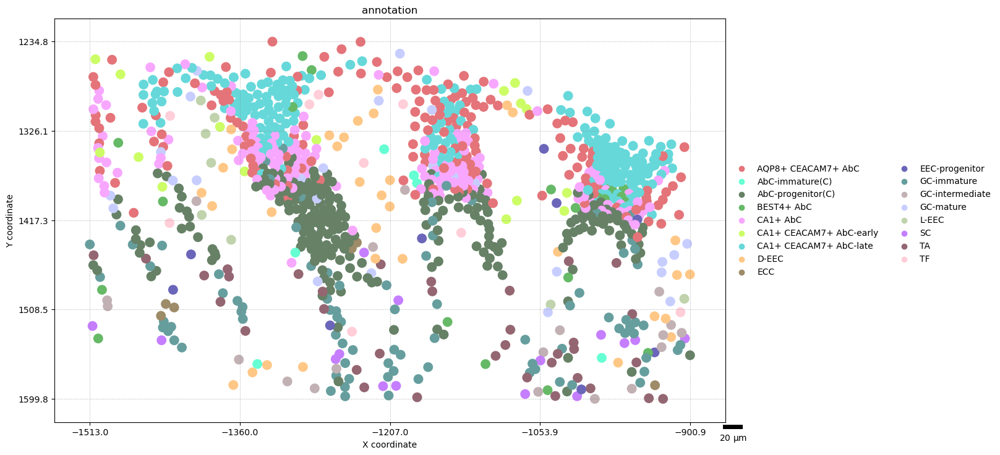

Cropping PIN1440 to region: x[1400,2200], y[-1750,-1300]
Saved cropped plot: ../Figures_Alexandre/Rotated_Spatial/Colon_healthy_only_slide12_PIN1440_Rotated_Spatial_Cropped.svg


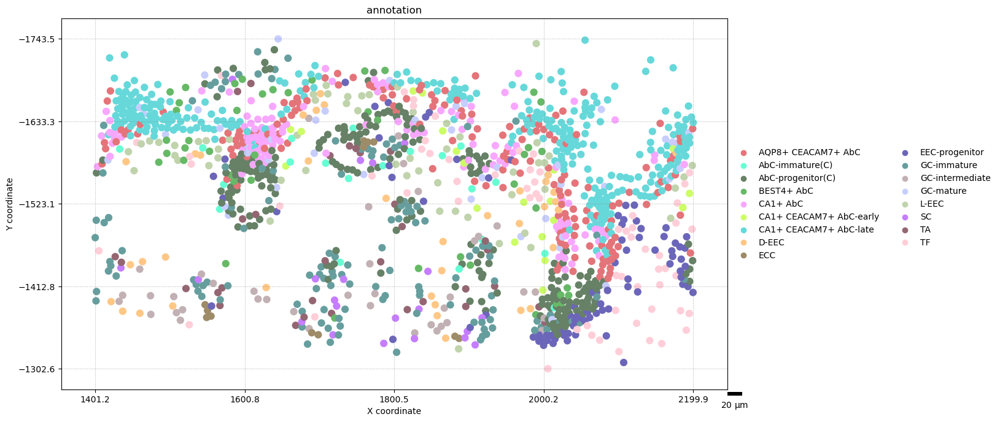

Cropping PIN1328 to region: x[1600,2000], y[-2222,-1850]
Saved cropped plot: ../Figures_Alexandre/Rotated_Spatial/Colon_healthy_only_slide14_PIN1328_Rotated_Spatial_Cropped.svg


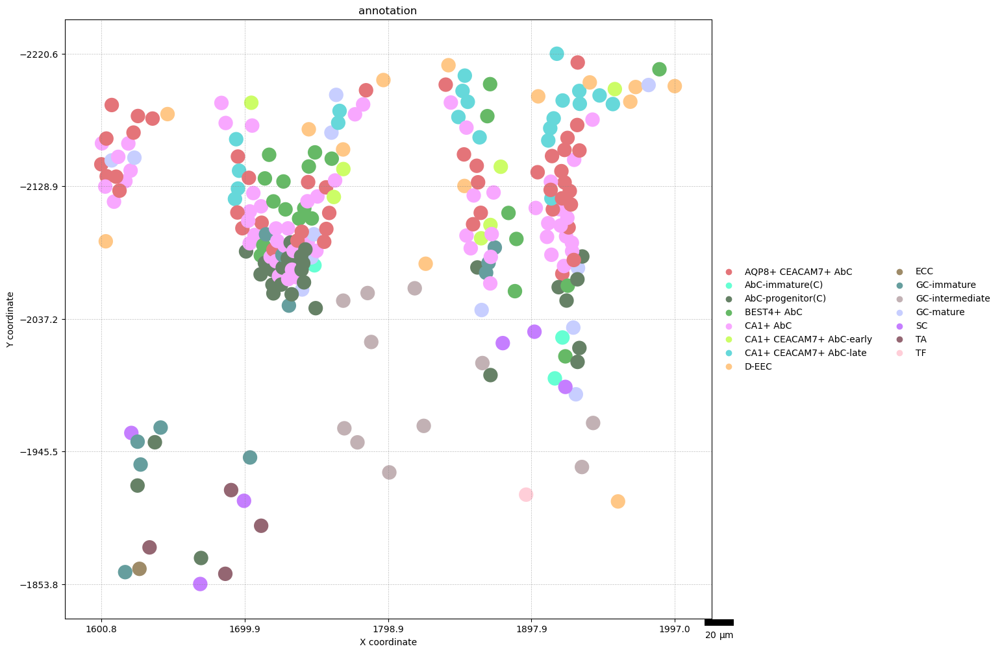

Cropping PIN1363 to region: x[-1516,-900], y[1100,1600]
Saved cropped plot: ../Figures_Alexandre/Rotated_Spatial/Colon_healthy_DISEASED_slide8_PIN1363_Rotated_Spatial_Cropped.svg


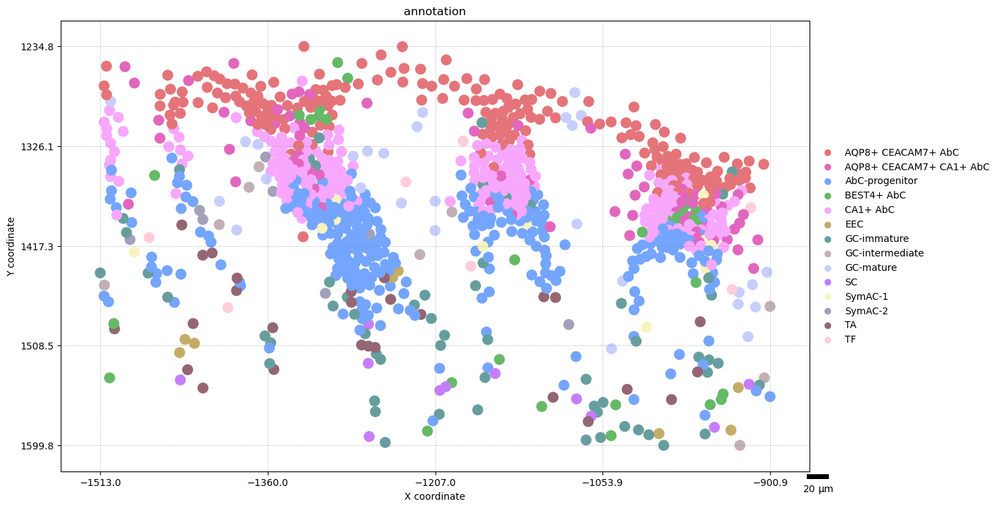

Cropping PIN1440 to region: x[1400,2200], y[-1750,-1300]
Saved cropped plot: ../Figures_Alexandre/Rotated_Spatial/Colon_healthy_DISEASED_slide12_PIN1440_Rotated_Spatial_Cropped.svg


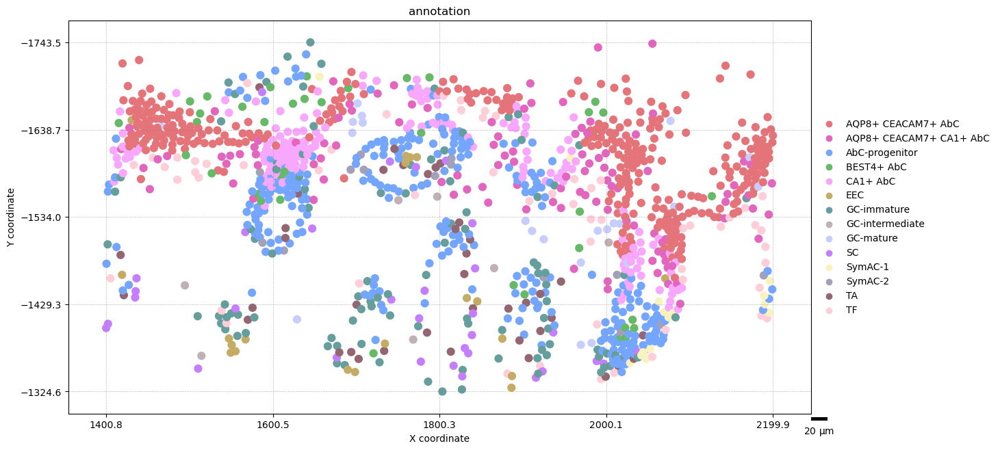

Cropping PIN1328 to region: x[1600,2000], y[-2222,-1850]
Saved cropped plot: ../Figures_Alexandre/Rotated_Spatial/Colon_healthy_DISEASED_slide14_PIN1328_Rotated_Spatial_Cropped.svg


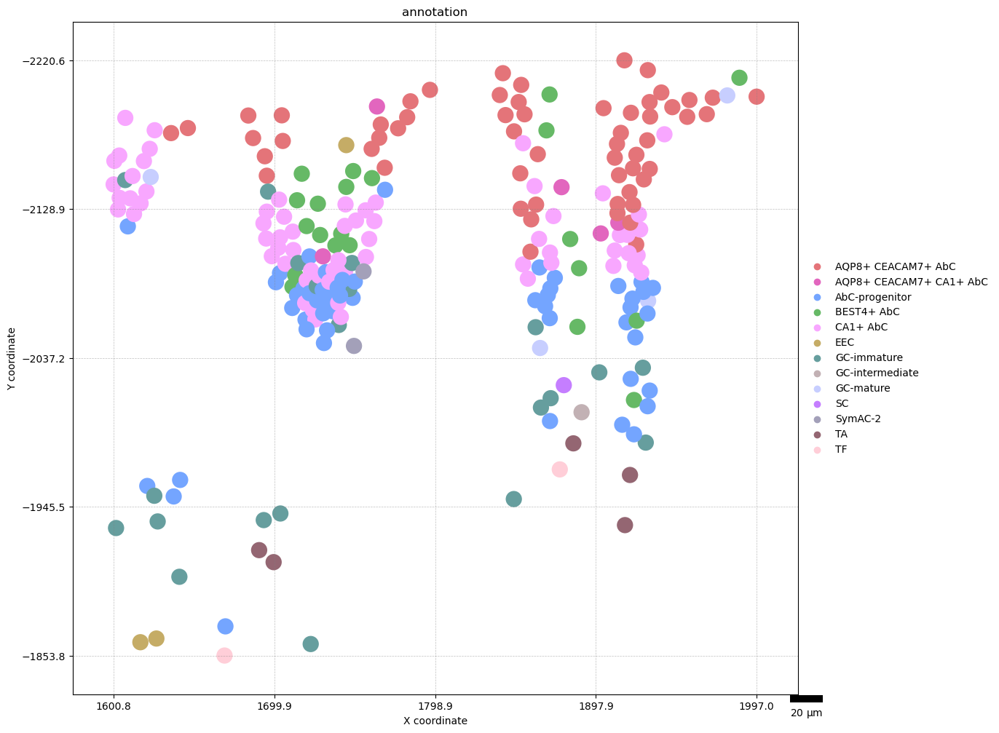

Cropping PIN1526 to region: x[-3500,-2600], y[1750,2300]
Saved cropped plot: ../Figures_Alexandre/Rotated_Spatial/Colon_CD_IBS_slide28_PIN1526_Rotated_Spatial_Cropped.svg


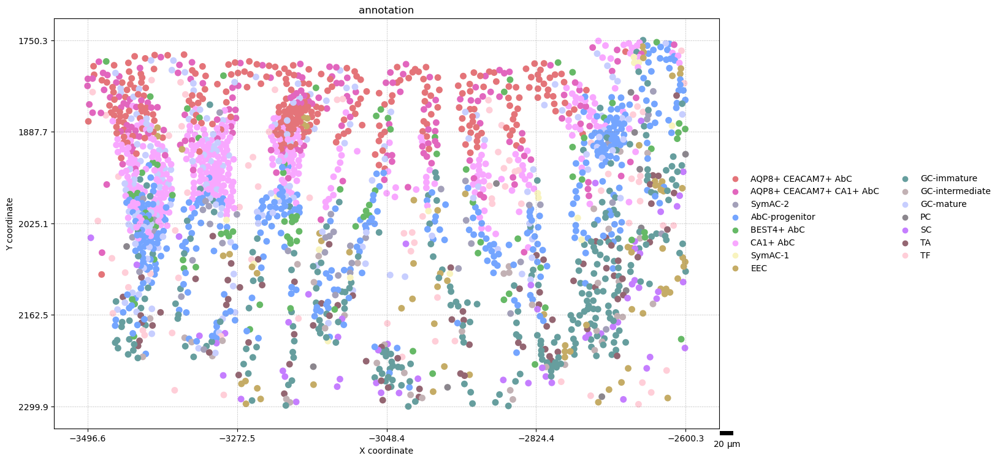

Cropping PIN1565 to region: x[-1900,-800], y[1200,1800]
Saved cropped plot: ../Figures_Alexandre/Rotated_Spatial/Colon_CD_IBS_slide29_PIN1565_Rotated_Spatial_Cropped.svg


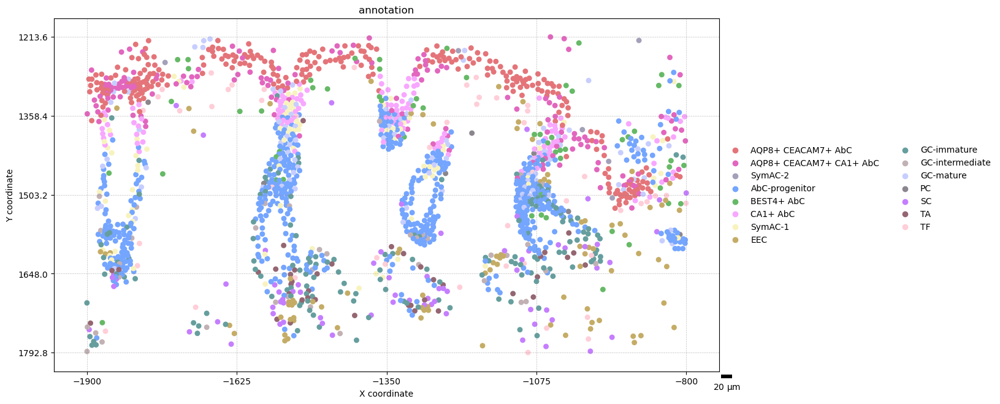

Cropping PIN1588 to region: x[2000,2700], y[-1750,-1150]
Saved cropped plot: ../Figures_Alexandre/Rotated_Spatial/Colon_CD_NO_IBS_slide24_PIN1588_Rotated_Spatial_Cropped.svg


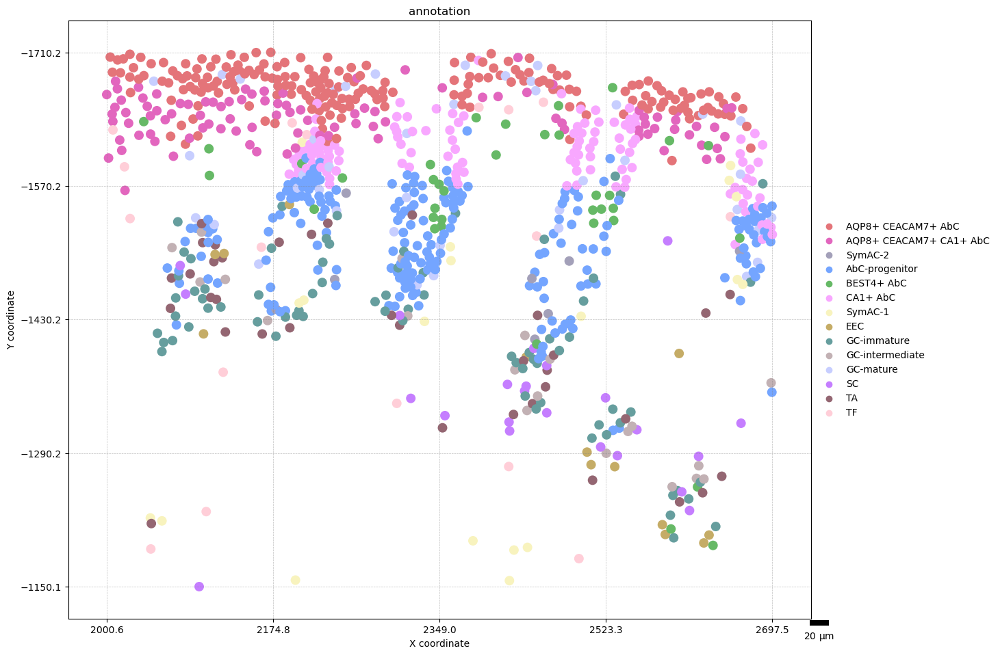

In [29]:
selected_pins = ["PIN1363", "PIN1440", "PIN1565", "PIN1526", "PIN1588",'PIN1328']

crop_regions = {
    "PIN1363": (-1516, -900, 1100, 1600),
    "PIN1440": (1400, 2200, -1750,-1300),
    "PIN1565": (-1900, -800, 1200, 1800),
    "PIN1526": (-3500, -2600, 1750, 2300),
    "PIN1588": (2000, 2700, -1750, -1150),
   # "PIN1328": (2000 ,2800 ,-2222 ,-1850 ),
   "PIN1328": ( 1600,2000 ,-2222 ,-1850)}

for dataset_name, (adata, rotation_dict, spot_size) in datasets.items():
    plot_and_save_rotated_spatial(
        adata, dataset_name, rotation_dict, output_dir,
        spot_size=spot_size,
        target_pins=selected_pins,
        crop_regions=crop_regions
    )

Cropping PIN1456_2 to region: x[3500,4200], y[-1900,-1300]
Saved cropped plot: ../Figures_Alexandre/Rotated_Spatial/Rectum_healthy_only_slide7_PIN1456_2_Rotated_Spatial_Cropped.svg


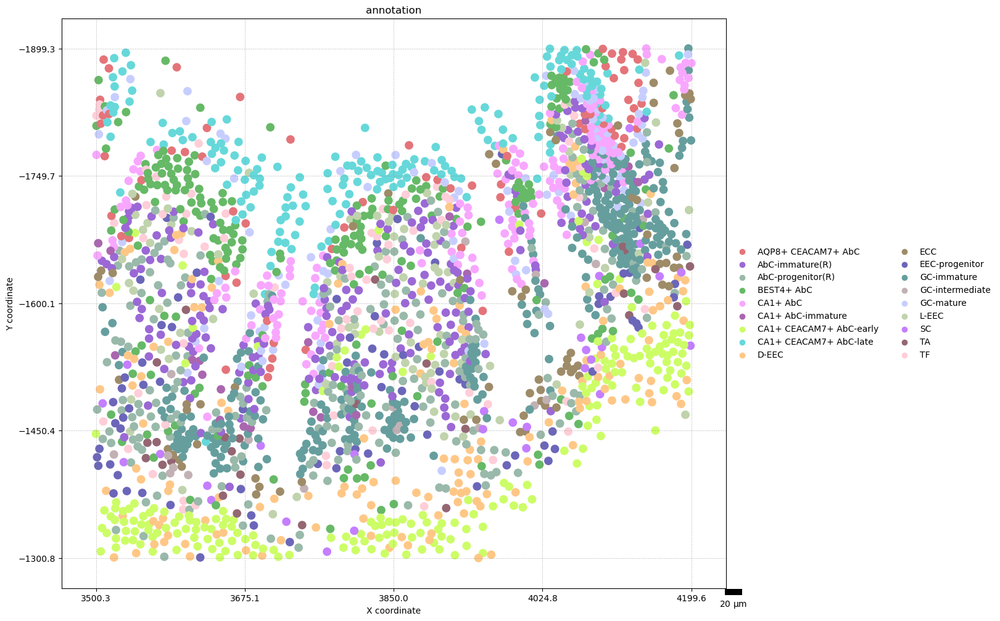

Cropping PIN1456_2 to region: x[3500,4200], y[-1900,-1300]
Saved cropped plot: ../Figures_Alexandre/Rotated_Spatial/Rectum_healthy_DISEASED_slide7_PIN1456_2_Rotated_Spatial_Cropped.svg


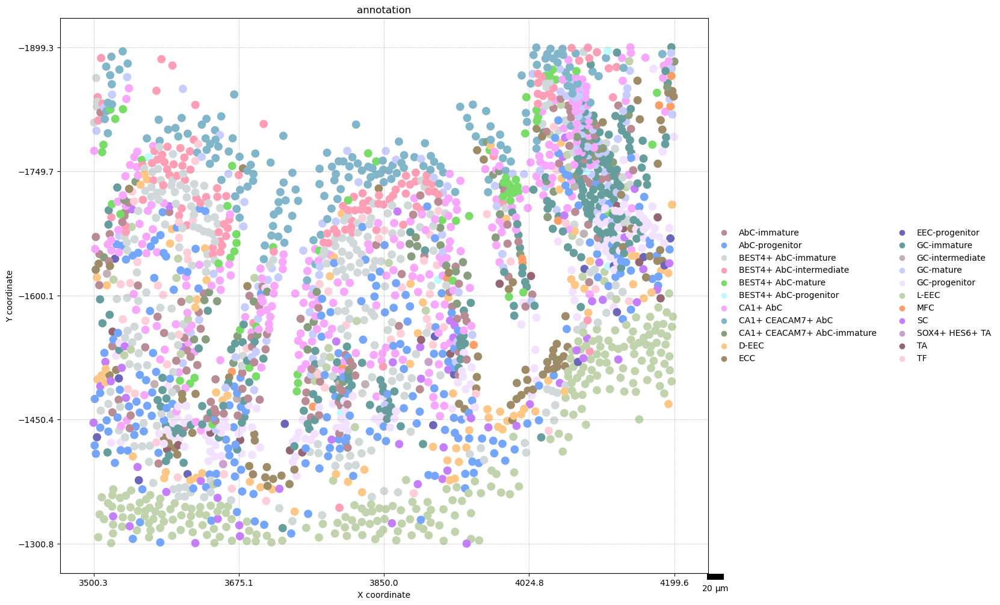

Cropping PIN1458 to region: x[-6000,-5000], y[950,1800]
Saved cropped plot: ../Figures_Alexandre/Rotated_Spatial/Rectum_IBS_C_slide22_PIN1458_Rotated_Spatial_Cropped.svg


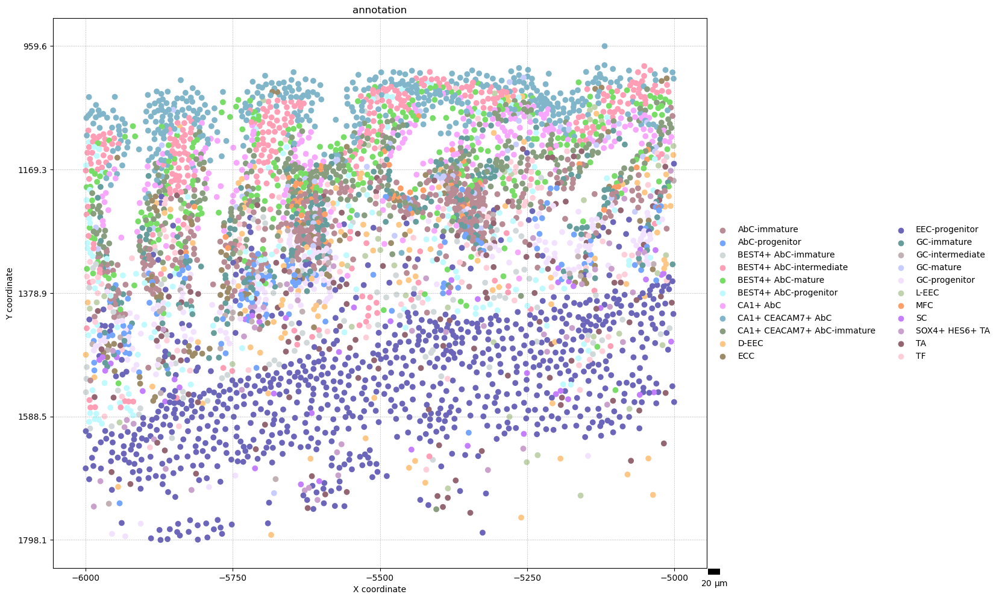

Cropping PIN1340 to region: x[5000,6100], y[-1950,-1300]
Saved cropped plot: ../Figures_Alexandre/Rotated_Spatial/Rectum_IBS_D_slide16_PIN1340_Rotated_Spatial_Cropped.svg


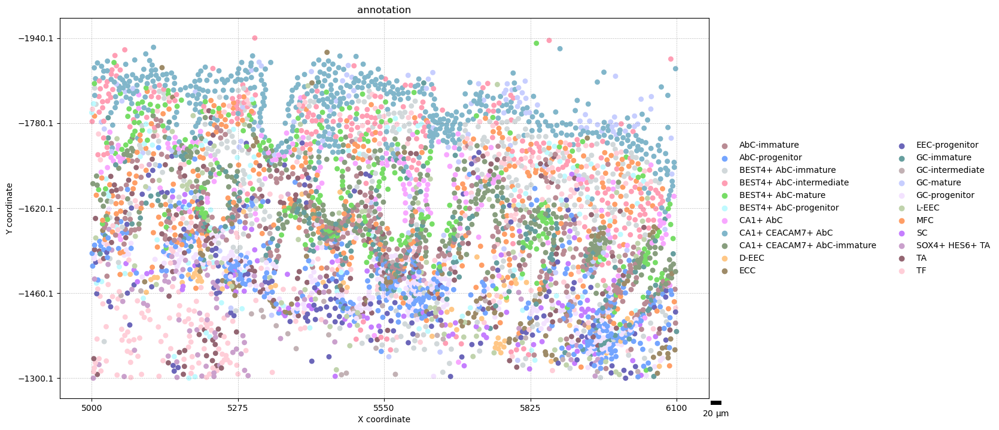

Cropping PIN1067 to region: x[-2100,-1300], y[1100,1950]
Saved cropped plot: ../Figures_Alexandre/Rotated_Spatial/Rectum_IBS_D_slide17_PIN1067_Rotated_Spatial_Cropped.svg


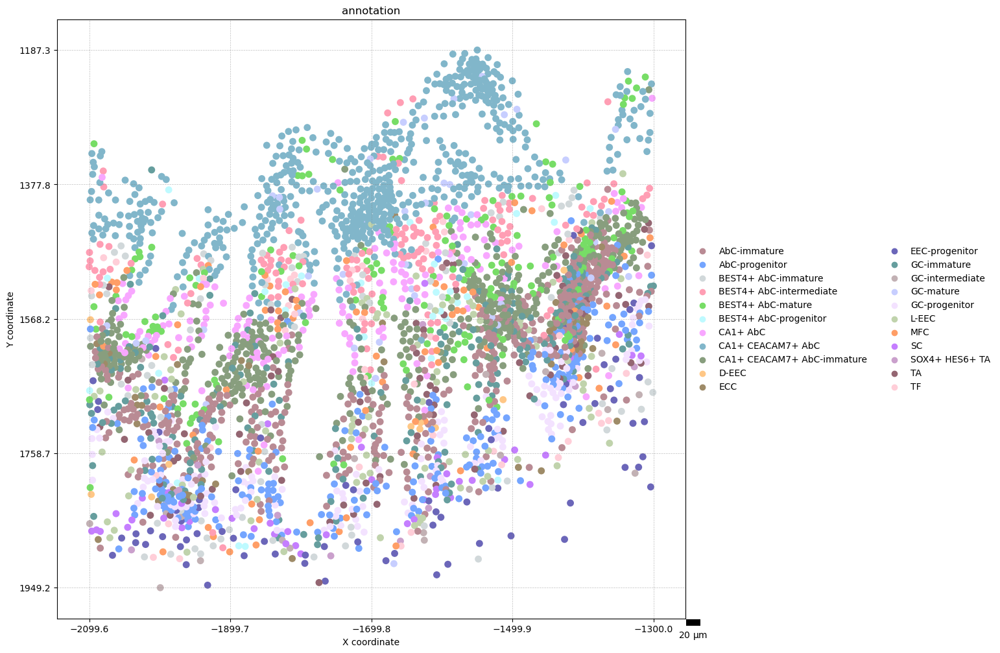

In [30]:
selected_pins = ["PIN1456_2", "PIN1458", "PIN1067", "PIN1340"]

crop_regions = {
    "PIN1456_2": (3500, 4200, -1900,-1300),
    "PIN1458": (-6000, -5000, 950, 1800),
    "PIN1067": (-2100,-1300,1100,1950),
    "PIN1340": (5000,6100,-1950,-1300)}

for dataset_name, (adata, rotation_dict, spot_size) in datasets.items():
    plot_and_save_rotated_spatial(
        adata, dataset_name, rotation_dict, output_dir,
        spot_size=10,
        target_pins=selected_pins,
        crop_regions=crop_regions)

In [ ]:
def plot_and_save_rotated_genes(adata, dataset_name, rotation_dict, output_dir, genes, spot_size=15):
    """
    Rotates spatial coordinates per slide, plots gene expression data, and saves figures.

    Parameters:
    - adata: AnnData object with spatial data in obsm['spatial']
    - dataset_name: Name of the dataset (e.g., "Rectum_healthy")
    - rotation_dict: Dictionary mapping slide names to rotation angles (in degrees)
    - output_dir: Directory where figures will be saved
    - genes: List of genes to plot separately
    - spot_size: Spot size for plotting (default=15)
    """
    unique_slides = adata.obs["Slide"].dropna().unique()
    for slide in unique_slides:
        if slide not in rotation_dict:
            print(f"Skipping {slide} (no rotation angle provided).")
            continue  # Skip slides without a defined rotation angle

        # Subset the data for this slide
        temp_sample = adata[adata.obs["Slide"] == slide].copy()
        
        # Rotate coordinates
        angle = rotation_dict[slide]
        original_coords = temp_sample.obsm["spatial"].copy()
        rotated_x, rotated_y = rotate_coords(original_coords[:, 0], original_coords[:, 1], angle)
        temp_sample.obsm["spatial"] = np.column_stack((rotated_x, rotated_y))
        
        # Plot each gene separately
        for gene in genes:
            if gene not in adata.var_names:
                print(f"Skipping {gene} (not found in dataset).")
                continue

            fig, ax = plt.subplots(figsize=(14, 12))
            fig.patch.set_facecolor("white")
            ax.set_facecolor("white")
            print(f"Processing {slide} ({dataset_name}) - {gene} with rotation angle: {angle}°")

            # Plot gene expression
            sc.pl.spatial(
                temp_sample,
                spot_size=spot_size,
                color=gene,
                ax=ax,
                show=False,layer='scvi_counts',vmax=5
            )

            # Rasterize to reduce file size
            for artist in ax.collections:
                artist.set_rasterized(True)
            # Save the figure    
            pin = temp_sample.obs['correctPIN'].unique()[0]
            output_file = os.path.join(output_dir, f"{dataset_name}_{slide}_{gene}_{pin}_Rotated_Spatial_rawcounts_vmax5.svg")
            fig.savefig(output_file, dpi=400, bbox_inches="tight", transparent=True)
            print(f"Saved rotated gene plot: {output_file}")
            plt.close(fig)  # Close figure to free memory

# 🟢 Set output directory
output_dir = "../Figures_Alexandre/Rotated_Spatial_Genes/"
os.makedirs(output_dir, exist_ok=True)

# 🟢 Define datasets, rotation mappings, and genes to plot
genes_to_plot = ["CFTR", "GUCY2C", "SLC9A3", "PCSK1N"]
datasets = {
    "Rectum_healthy": (
        spatial_rectum_healthy,
        {'slide0': 90, 'slide1': 90, 'slide2': -90, 'slide3': -90,
         'slide4': -90, 'slide5': -90, 'slide6': -90, 'slide7': -90},
        15
    ),
    "Rectum_IBS_C": (
        spatial_rectum_IBS_C,
        {'slide20': -90, 'slide22': 90},
        15
    ),
    "Rectum_IBS_D": (
        spatial_rectum_IBS_D,
        {'slide16': -90, 'slide17': 90, 'slide18': 90,
         'slide19': -90, 'slide21': -90},
        15
    ),
    "Colon_healthy": (
        spatial_colon_healthy,
        {'slide8': 90, 'slide9': -90, 'slide10': -90, 'slide11': -90,
         'slide12': -90, 'slide13': 90, 'slide14': -90, 'slide15': 90},
        10
    ),
    "Colon_CD_IBS": (
        spatial_colon_CD_IBS,
        {'slide28': 90, 'slide29': 90, 'slide30': 90, 'slide31': 90},
        10
    ),
    "Colon_CD_NO_IBS": (
        spatial_colon_CD_NO_IBS,
        {'slide24': -90, 'slide25': -90, 'slide26': 90, 'slide27': -90},
        10
    )
}


# 🟢 Process all datasets for gene expression
for dataset_name, (adata, rotation_dict, spot_size) in datasets.items():
    plot_and_save_rotated_genes(adata, dataset_name, rotation_dict, output_dir, genes_to_plot, spot_size)


# Now we remove the healthy only and take only the disease-healthy dataset in combined from now on 

In [32]:
# Concatenate all spatial colon datasets
spatial_colon_combined = sc.concat(
    [spatial_colon_healthy_disease, spatial_colon_CD_IBS, spatial_colon_CD_NO_IBS],
    label="batch",
    keys=["healthy-CD", "CD_IBS", "CD_NO_IBS"])

# Concatenate all spatial rectum datasets
spatial_rectum_combined = sc.concat(
    [spatial_rectum_healthy_disease, spatial_rectum_IBS_C, spatial_rectum_IBS_D],
    label="batch",
    keys=["healthy-IBS", "IBS_C", "IBS_D"])
print(spatial_colon_combined)
print(spatial_rectum_combined)

AnnData object with n_obs × n_vars = 201047 × 114
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'S.Score', 'G2M.Score', 'Phase', 'old.ident', 'RNA_snn_res.0.4', 'RNA_snn_res.0.5', 'RNA_snn_res.0.6', 'RNA_snn_res.0.7', 'RNA_snn_res.0.8', 'RNA_snn_res.0.9', 'RNA_snn_res.1', 'RNA_snn_res.1.1', 'RNA_snn_res.1.2', 'RNA_snn_res.1.3', 'RNA_snn_res.1.4', 'seurat_clusters', 'PIN', 'Status', 'Subtype', 'RNA_snn_res.1.5', 'RNA_snn_res.1.6', 'RNA_snn_res.3', 'Age_group', 'Pain_score', 'Sex', 'Diaorrhea', 'Constipation', 'Tissue', 'Previous_Cluster', 'Cluster_2', 'Cluster', '_batch_annotation', 'n_counts', '_dataset', '_reference_labels_annotation', '_labels_annotation', '_ref_subsample', 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'wrongPIN', 'correctPIN', 'tissue', 'condition', 'runnumber', 'Slide', 'n_gene

In [ ]:
sc_colon_combined = sc.concat(
    [sc_colon_healthy, sc_colon_CD_IBS, sc_colon_CD_NO_IBS],
    label="Dataset",
    keys=["sc_healthy", "sc_CD_IBS", "sc_CD_NO_IBS"]
)
sc_rectum_combined = sc.concat(
    [sc_rectum_healthy, sc_rectum_IBS_C, sc_rectum_IBS_D],
    label="Dataset",
    keys=["sc_healthy", "sc_IBS_C", "sc_IBS_D"]
)
sc_rectum_combined

Saved: ../Figures_Alexandre/Colon_celltype_distribution.svg


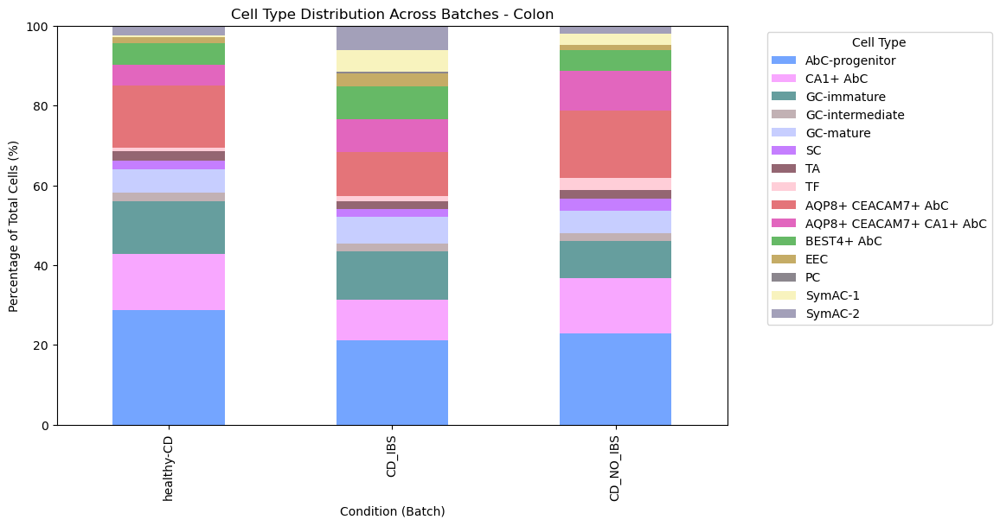

Saved: ../Figures_Alexandre/Rectum_celltype_distribution.svg


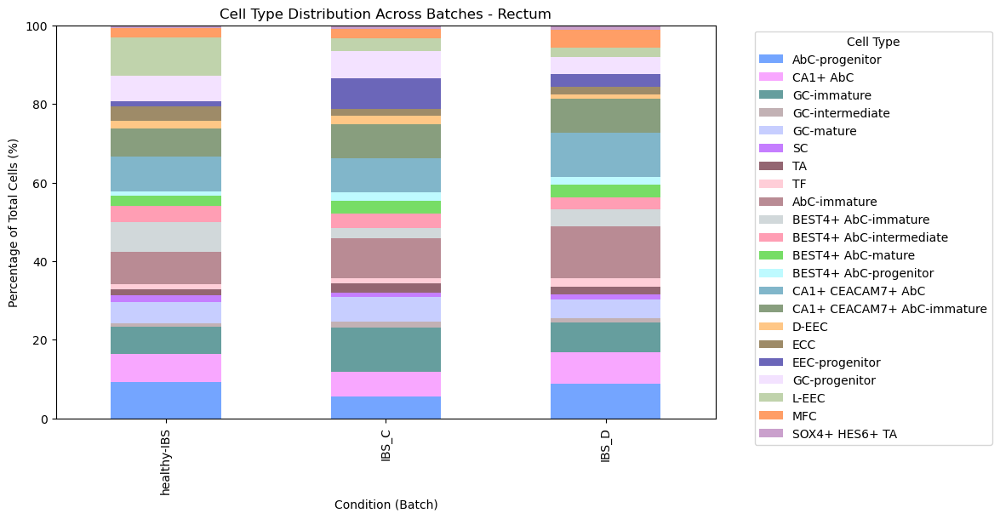

In [33]:
import scanpy as sc
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import os

# Ensure output directory exists
output_dir = "../Figures_Alexandre/"
os.makedirs(output_dir, exist_ok=True)

# Function to plot and save stacked bar chart with custom colormap and correct order
def plot_stacked_bar(adata, dataset_name, celltype_colormap, overlapping_celltypes):
    """
    Plots a stacked bar chart showing cell type distributions across batches with correct cell type ordering.

    Parameters:
    - adata: Concatenated AnnData object
    - dataset_name: Name of the dataset (Colon or Rectum)
    - celltype_colormap: Dictionary mapping cell types to colors
    - overlapping_celltypes: Set of cell types that overlap between colon and rectum
    """
    # Compute cell type proportions per batch
    celltype_counts = (
        adata.obs.groupby(["batch", "annotation"])
        .size()
        .reset_index(name="Count")
    )

    # Normalize to percentages per batch
    celltype_counts["Percentage"] = (
        celltype_counts.groupby("batch")["Count"].transform(lambda x: (x / x.sum()) * 100)
    )

    # Pivot for stacked bar plotting
    celltype_pivot = celltype_counts.pivot(index="batch", columns="annotation", values="Percentage")

    # Sort cell types: overlapping first, then unique ones alphabetically
    ordered_celltypes = sorted(overlapping_celltypes) + sorted(set(celltype_pivot.columns) - overlapping_celltypes)
    celltype_pivot = celltype_pivot[ordered_celltypes]

    # Get colors for the ordered cell types
    colors = [celltype_colormap.get(celltype, "#808080") for celltype in ordered_celltypes]

    # Plot with custom colors
    ax = celltype_pivot.plot(kind="bar", stacked=True, figsize=(10, 6), color=colors)

    plt.xlabel("Condition (Batch)")
    plt.ylabel("Percentage of Total Cells (%)")
    plt.title(f"Cell Type Distribution Across Batches - {dataset_name}")
    plt.legend(title="Cell Type", bbox_to_anchor=(1.05, 1), loc="upper left")
    plt.ylim(0, 100)

    # Save as SVG
    output_file = os.path.join(output_dir, f"{dataset_name}_celltype_distribution.svg")
    # plt.savefig(output_file, format="svg", bbox_inches="tight")
    print(f"Saved: {output_file}")

    # Show the plot
    plt.show()

# Get overlapping cell types
colon_celltypes = set(spatial_colon_combined.obs["annotation"].unique())
rectum_celltypes = set(spatial_rectum_combined.obs["annotation"].unique())
overlapping_celltypes = colon_celltypes.intersection(rectum_celltypes)

# Plot and save for Colon
plot_stacked_bar(spatial_colon_combined, "Colon", celltype_colormap, overlapping_celltypes)

# Plot and save for Rectum
plot_stacked_bar(spatial_rectum_combined, "Rectum", celltype_colormap, overlapping_celltypes)


AnnData object with n_obs × n_vars = 386855 × 15430
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'S.Score', 'G2M.Score', 'Phase', 'old.ident', 'Status', 'Subtype', 'PIN', 'RNA_snn_res.3', 'Pain_score', 'Age_group', 'Sex', 'Diaorrhea', 'Constipation', 'Tissue', 'Previous_Cluster', 'UMAP_1', 'UMAP_2', 'Previous_Cluster_2', 'Cluster', 'Dataset'
    obsm: 'X_umap'
    layers: 'log1p_norm', 'rawcounts'

In [35]:
def plot_six_bar_comparison(sc_datasets_dict, spatial_datasets_dict, dataset_name, celltype_colormap, ordered_celltypes):
    """
    Plots a 6-bar stacked comparison: sc vs spatial for each of 3 conditions (e.g., Healthy, CD_IBS, CD_NO_IBS).
    Cell types are ordered alphabetically, optionally prioritizing overlapping ones from a reference list.
    """
    import scanpy as sc
    import pandas as pd
    import matplotlib.pyplot as plt
    import os

    all_data = []

    for condition in sc_datasets_dict:
        sc_adata = sc_datasets_dict[condition].copy()
        spatial_adata = spatial_datasets_dict[condition].copy()

        sc_adata.obs["annotation"] = sc_adata.obs["Cluster"]
        sc_adata.obs["Source"] = f"SC_{condition}"
        spatial_adata.obs["Source"] = f"Spatial_{condition}"
        all_data.extend([sc_adata, spatial_adata])

    # Concatenate all datasets safely
    combined = sc.concat(all_data)

    # Filter out NaNs
    combined = combined[~combined.obs["annotation"].isna()]

    # Filter only annotations present in ordered_celltypes
    combined = combined[combined.obs["annotation"].isin(ordered_celltypes)]

    # Compute proportions
    celltype_counts = (
        combined.obs.groupby(["Source", "annotation"])
        .size()
        .reset_index(name="Count")
    )

    celltype_counts["Percentage"] = (
        celltype_counts.groupby("Source")["Count"].transform(lambda x: (x / x.sum()) * 100)
    )

    # Pivot for stacked bar plot
    celltype_pivot = celltype_counts.pivot(index="Source", columns="annotation", values="Percentage")

    # Sort cell types: overlapping first (alphabetically), then unique alphabetically
    overlapping_celltypes = set(celltype_pivot.columns).intersection(ordered_celltypes)
    unique_celltypes = set(celltype_pivot.columns) - overlapping_celltypes

    ordered_celltypes_final = (
        sorted(overlapping_celltypes) +
        sorted(unique_celltypes)
    )

    # Reorder columns in pivot
    celltype_pivot = celltype_pivot[ordered_celltypes_final]

    # Define color palette
    colors = [celltype_colormap.get(celltype, "#808080") for celltype in ordered_celltypes_final]

    # Plot
    ax = celltype_pivot.plot(kind="bar", stacked=True, figsize=(12, 6), color=colors)
    ax.set_xlabel("Dataset")
    ax.set_ylabel("Percentage of Total Cells (%)")
    ax.set_title(f"Cell Type Distribution Comparison - {dataset_name}")
    plt.legend(title="Cell Type", bbox_to_anchor=(1.05, 1), loc="upper left")
    plt.ylim(0, 100)
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()

    # Save figure
    output_path = f"../Figures_Alexandre/{dataset_name}_Six_Bar_Comparison.svg"
    # plt.savefig(output_path, format="svg", bbox_inches="tight")
    print(f"Saved: {output_path}")
    plt.show()


Saved: ../Figures_Alexandre/Colon_Six_Bar_Comparison.svg


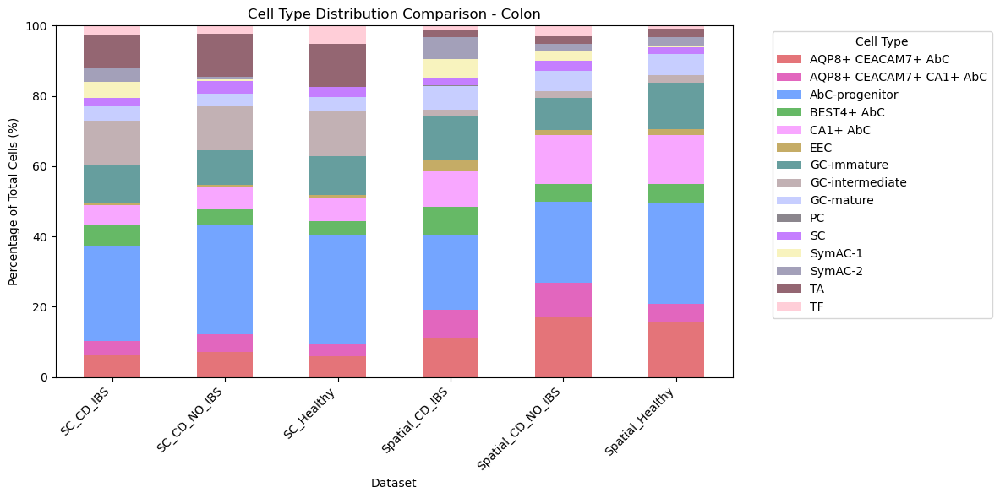

In [36]:
sc_colon_datasets = {
    "Healthy": sc_colon_healthy,
    "CD_IBS": sc_colon_CD_IBS,
    "CD_NO_IBS": sc_colon_CD_NO_IBS
}

spatial_colon_datasets = {
    "Healthy": spatial_colon_healthy_disease,
    "CD_IBS": spatial_colon_CD_IBS,
    "CD_NO_IBS": spatial_colon_CD_NO_IBS
}

plot_six_bar_comparison(
    sc_colon_datasets,
    spatial_colon_datasets,
    "Colon",
    celltype_colormap,
    colon_celltypes
)


Saved: ../Figures_Alexandre/Rectum_Six_Bar_Comparison.svg


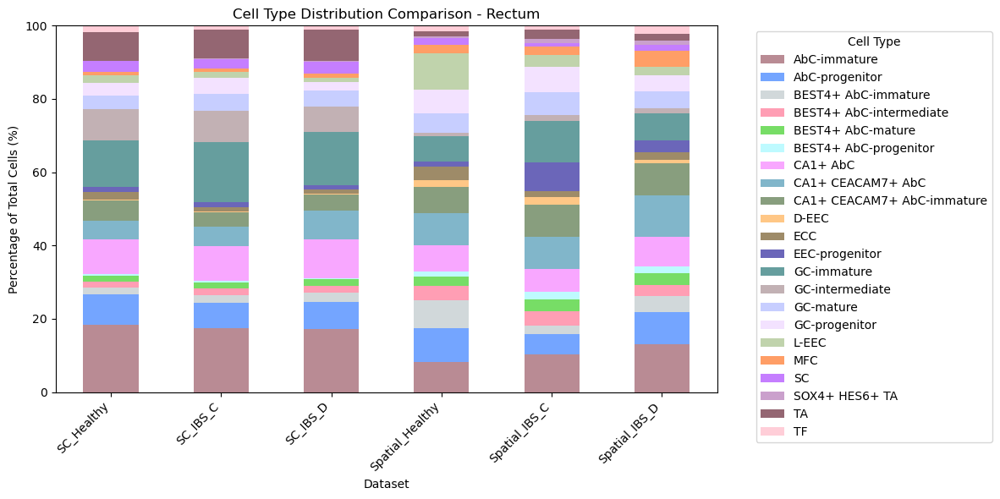

In [37]:
sc_rectum_datasets = {
    "Healthy": sc_rectum_healthy,
    "IBS_C": sc_rectum_IBS_C,
    "IBS_D": sc_rectum_IBS_D
}

spatial_rectum_datasets = {
    "Healthy": spatial_rectum_healthy_disease,
    "IBS_C": spatial_rectum_IBS_C,
    "IBS_D": spatial_rectum_IBS_D
}

plot_six_bar_comparison(
    sc_rectum_datasets,
    spatial_rectum_datasets,
    "Rectum",
    celltype_colormap,
    rectum_celltypes
)

Saved: ../Figures_Alexandre/Colon_per_slide_celltype_distribution.svg


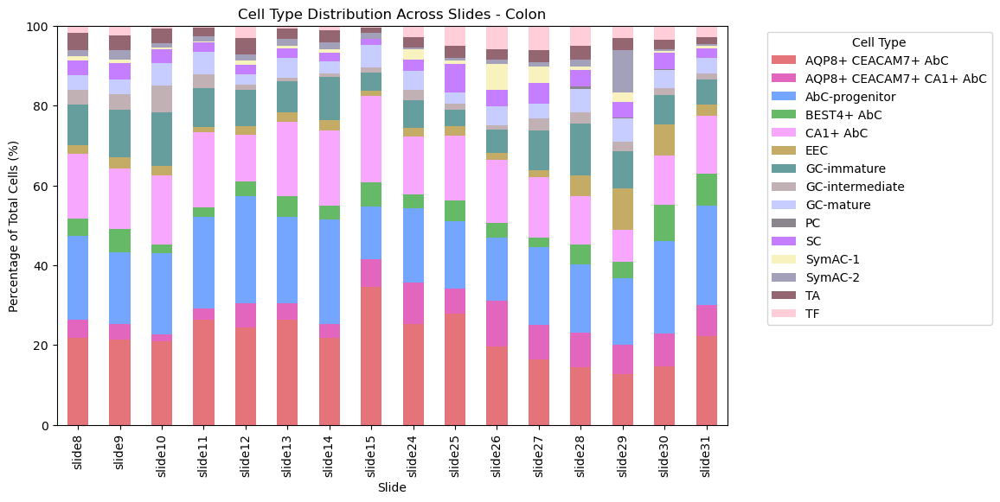

Saved: ../Figures_Alexandre/Rectum_per_slide_celltype_distribution.svg


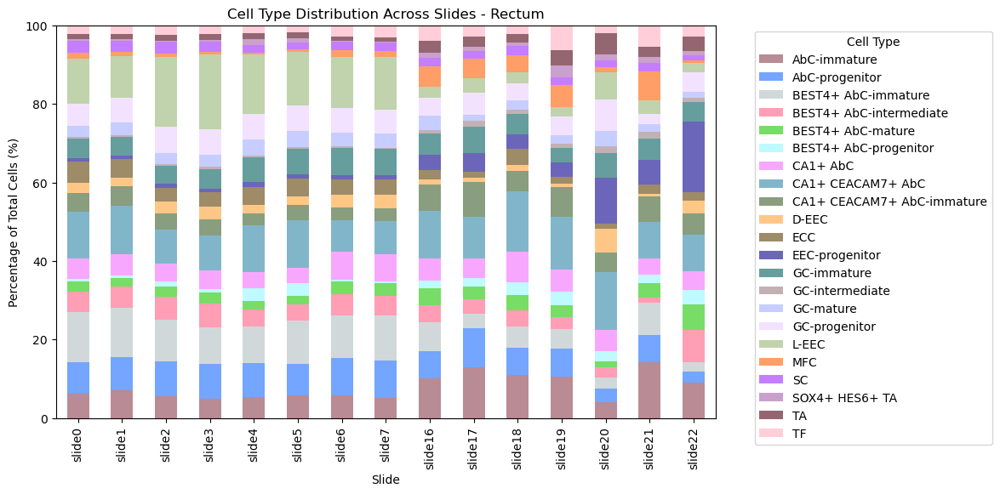

In [38]:
import scanpy as sc
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import os

# Ensure output directory exists
output_dir = "../Figures_Alexandre/"
os.makedirs(output_dir, exist_ok=True)

# Function to plot and save stacked bar chart with correct cell type ordering
def plot_stacked_bar(adata, dataset_name, celltype_colormap, overlapping_celltypes):
    """
    Plots a stacked bar chart showing cell type distributions across slides, 
    ensuring overlapping cell types are plotted first.

    Parameters:
    - adata: Concatenated AnnData object (spatial data).
    - dataset_name: Name of the dataset (Colon or Rectum).
    - celltype_colormap: Dictionary mapping cell types to colors.
    - overlapping_celltypes: Set of cell types that overlap between Colon and Rectum.
    """
    # Compute cell type proportions per slide
    celltype_counts = (
        adata.obs.groupby(["Slide", "annotation"])
        .size()
        .reset_index(name="Count")
    )

    # Normalize to percentages per slide
    celltype_counts["Percentage"] = (
        celltype_counts.groupby("Slide")["Count"].transform(lambda x: (x / x.sum()) * 100)
    )

    # Pivot for stacked bar plotting
    celltype_pivot = celltype_counts.pivot(index="Slide", columns="annotation", values="Percentage")

    # Order cell types: overlapping first, then unique ones alphabetically
    ordered_celltypes = sorted(overlapping_celltypes) + sorted(set(celltype_pivot.columns) - overlapping_celltypes)
    celltype_pivot = celltype_pivot[ordered_celltypes]

    # Get colors for the ordered cell types
    colors = [celltype_colormap.get(celltype, "#808080") for celltype in ordered_celltypes]

    # Plot with ordered colors
    ax = celltype_pivot.plot(kind="bar", stacked=True, figsize=(10, 6), color=colors)

    plt.xlabel("Slide")
    plt.ylabel("Percentage of Total Cells (%)")
    plt.title(f"Cell Type Distribution Across Slides - {dataset_name}")
    plt.legend(title="Cell Type", bbox_to_anchor=(1.05, 1), loc="upper left")
    plt.ylim(0, 100)

    # Save as SVG
    output_file = os.path.join(output_dir, f"{dataset_name}_per_slide_celltype_distribution.svg")
    # plt.savefig(output_file, format="svg", bbox_inches="tight")
    print(f"Saved: {output_file}")

    # Show the plot
    plt.show()


# Get overlapping cell types across all slides
colon_celltypes = set(spatial_colon_combined.obs["annotation"].unique())
rectum_celltypes = set(spatial_rectum_combined.obs["annotation"].unique())

# Plot and save for Colon
plot_stacked_bar(spatial_colon_combined, "Colon", celltype_colormap, colon_celltypes)

# Plot and save for Rectum
plot_stacked_bar(spatial_rectum_combined, "Rectum", celltype_colormap, rectum_celltypes)
